# Prepare functions

# Setup

In [1]:
import sys
sys.path.insert(1, '/users/genomics/xoel/canonades/bioinforgalician/src/python/celloracle')

In [2]:
import os

subset = 'NeuralPCW20'
os.chdir(f'/users/genomics/xoel/codebases/co_new/data/{subset}/')

In [3]:
import scanpy as sc
sc.set_figure_params(
    scanpy=True,
    dpi=80, 
    dpi_save=300, 
    frameon=True,
    vector_friendly=True, 
    fontsize=14, 
    figsize=None, 
    color_map=None,
    facecolor=None, 
    transparent=False, 
    ipython_format='png2x')
sc.settings.verbosity=4
sc.settings.autosave=True
sc.settings.autoshow=True

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 300

In [4]:
n_cores = min(int(os.getenv('SLURM_CPUS_PER_TASK')) -4 or 18, 96)


In [5]:
groups = {
    'vRG': ['vRG E', 'vRG L'],
    'vtRG': ['vRG E', 'vRG L', 'tRG'],
    'oRG': ['oRG E', 'oRG L'],
    'RG E': ['vRG E', 'vRG E'],
    'RG L': ['vRG E', 'vRG L'],
    'RGC': ['vRG E','vRG L','tRG','oRG E','oRG L'],
    'Neural': ['Neu E', 'nIPC', 'GluN4', 'GluN5'], # 
    'GluN': ['GluN4', 'GluN5']
}

# **Part 1 //** Create a gene regulatory network (GRN)

## Find ATAC coaccessible peaks

In [24]:
from cicero_helper import create_cicero_cmd

In [11]:
os.listdir()

['Rplots.pdf',
 'coaccessible_peaks.coaccessibility=0.8.csv',
 '.ipynb_checkpoints',
 'RNA.processed.h5ad',
 'RNA.unprocessed.h5ad',
 'ATAC.cell_metadata.tsv',
 'RootCellSelection.html',
 'cicero_umap.pdf',
 'celloracle_tfinfo.coaccessibility=0.8.score=8.celloracle.tfinfo',
 'cicero.log',
 'base_grn.coaccessibility=0.8.score=8.base_grn',
 'ATAC.peak_metadata.tsv',
 'cicero_connections.rds',
 'ATAC.unprocessed.tsv',
 'cicero_peaks.csv',
 'cicero_connections.csv',
 'figures']

In [5]:
r_cmd = create_cicero_cmd( 
    atac_path='ATAC.unprocessed.tsv',
    peaks_bed_path='ATAC.peak_metadata.tsv',
    cell_metadata_path='ATAC.cell_metadata.tsv', 
    plot_by='cell.type', 
    R_quote='',
    str_quote="\'",
    save_dir='./', 
    prefix=None, 
    verbose='TRUE')

with open('temp_cicero.sh', 'wt') as f:
    f.writelines(r_cmd)
print(r_cmd)

source('/users/genomics/xoel/canonades/bioinforgalician/src/python/celloracle/cicero.R',echo=TRUE)

pipe_cicero_conns(atac_path='ATAC.unprocessed.tsv',peaks_bed_path='ATAC.peak_metadata.tsv',cell_metadata_path='ATAC.cell_metadata.tsv',plot_by='cell.type',save_dir='./',prefix=NULL,verbose=TRUE)


In [6]:
%%bash -s "$r_cmd" "$subset"
eval "$(micromamba shell hook --shell=bash)"
micromamba activate ~/venvs/cicero
# LOCAL
# Rscript --vanilla --verbose ./temp_cicero.sh
# sbatch --job-name=$2 --output=log.test.txt --mem=185GB --time=4-00:00:00 --partition=normal,long,bigmem --cpus-per-task=20 --wrap="Rscript --vanilla --verbose ./temp_cicero.sh"

In [7]:
# !while [ 1 ]; do tail log.test.txt; sleep 30; clear; done
!cat log.test.txt | grep -v 'chr1' |  tail -20

Overlap QC metrics:
Cells per bin: 50
Maximum shared cells bin-bin: 44
Mean shared cells bin-bin: 0.910450099280622
Median shared cells bin-bin: 0
[2] Running cicero analysis
[1] "Starting Cicero"
[1] "Calculating distance_parameter value"
[1] "Running models"
[1] "Assembling connections"
[1] "Successful cicero models:  9581"
[1] "Other models: "

  Too many elements in range Zero or one element in range 
                        1123                         2396 
[1] "Models with errors:  0"
[1] "Done"
[SAVE] Saving connections & peaks
                          Peak1                     Peak2      coaccess
 [ reached 'max' / getOption("max.print") -- omitted 101765255 rows ]


In [8]:
!rm ./temp_cicero.sh

## Run motif analysis and filter

In [9]:
import cicero_to_grn 

Adding to PATH: /soft/system/software/BEDTools/2.30.0-GCC-10.2.0/bin


In [10]:
os.listdir()

['Rplots.pdf',
 'coaccessible_peaks.coaccessibility=0.8.csv',
 'RNA.unprocessed.h5ad',
 'ATAC.cell_metadata.tsv',
 'log.test.txt',
 'cicero_umap.pdf',
 'celloracle_tfinfo.coaccessibility=0.8.score=8.celloracle.tfinfo',
 'base_grn.coaccessibility=0.8.score=8.base_grn',
 'ATAC.peak_metadata.tsv',
 'cicero_connections.rds',
 'ATAC.unprocessed.tsv',
 'cicero_peaks.csv',
 'cicero_connections.csv']

In [11]:
grn_result = cicero_to_grn.run_motif_analysis(
    peaks_csv='cicero_peaks.csv',
    connections_csv='cicero_connections.csv',
    extra_peaks=None,
    ref_genome='hg38',
    provider='UCSC',
    frp=0.02,
    coacc_thres=0.8,
    motifs=None,
    motif_score_thres=8,
    save_dir='./',
    prefix=None,
    verbose=True
)

[1] Loading peaks and connections
[2] Loading genome
hg38 is installed.
[3] Integrating peaks, connections and genome
que bed peaks: 650781
tss peaks in que: 44596
[4] Filtering peaks by coaccessibility (0.8)
Over threshold: 2.25 %
[5] Extracting peaks
[6] Performing motif scan (frp: 0.02)
No motif data entered. Loading default motifs for your species ...
 Default motif for vertebrate: gimme.vertebrate.v5.0. 
 For more information, please see https://gimmemotifs.readthedocs.io/en/master/overview.html 

Initiating scanner... 

Calculating FPR-based threshold. This step may take substantial time when you load a new ref-genome. It will be done quicker on the second time. 

Motif scan started .. It may take long time.



scanning:   0%|          | 0/40460 [00:00<?, ? sequences/s]

[7] Filtering motif score (motif_score_thres)
Over threshold: 49.69 %
Filtering finished: 11178844 -> 4141939
1. Converting scanned results into one-hot encoded dataframe.


  0%|          | 0/40460 [00:00<?, ?it/s]

2. Converting results into dictionaries.


  0%|          | 0/19985 [00:00<?, ?it/s]

  0%|          | 0/1098 [00:00<?, ?it/s]

[8] Saving results


  0%|          | 0/3 [00:00<?, ?it/s]

# **Part 2 //** Prepare RNA data

In [29]:
import scanpy as sc
import prepare_rna
%matplotlib inline

In [6]:
sorted(os.listdir())

['.ipynb_checkpoints',
 'ATAC.cell_metadata.tsv',
 'ATAC.peak_metadata.tsv',
 'ATAC.unprocessed.tsv',
 'Gradient.Perturbation.celloracle.gradient',
 'Links.Perturbation.celloracle.links',
 'Links.celloracle.links',
 'Oracle.Perturbation.celloracle.oracle',
 'Oracle.celloracle.oracle',
 'RNA.processed.h5ad',
 'RNA.unprocessed.h5ad',
 'RootCellSelection.html',
 'Rplots.pdf',
 'base_grn.coaccessibility=0.8.score=8.base_grn.parquet',
 'celloracle_tfinfo.coaccessibility=0.8.score=8.celloracle.tfinfo',
 'cicero.log',
 'cicero_connections.csv',
 'cicero_connections.rds',
 'cicero_peaks.csv',
 'cicero_umap.pdf',
 'cluster_GRN',
 'coaccessible_peaks.coaccessibility=0.8.csv',
 'figures',
 'network_plots',
 'perturbations',
 'perturbations.wrong p.mass']

In [7]:
adata_file = 'RNA.unprocessed.h5ad'
adata_complete = sc.read_h5ad(adata_file)

In [8]:
dict(
    RGCmaturationExtended = 'hft_w16_p7_r2_TGGAGAGAGAGGACTC',
    RGCmaturation = 'hft_w16_p7_r2_TGGAGAGAGAGGACTC',
    NeuralPCW16 = 'hft_w16_p7_r2_TGGAGAGAGAGGACTC',
    # NeuralPCW20 = 'hft_w20_p3_r1_AATGACCTCTACCAGA',
    NeuralPCW20 = 'hft_w20_p3_r2_CTATCCGAGGCGCTCT',
    Gliogenesis = 'hft_w16_p7_r2_TGGAGAGAGAGGACTC',
    GliogenesisExtended = 'hft_w16_p7_r2_TGGAGAGAGAGGACTC',
)

{'RGCmaturationExtended': 'hft_w16_p7_r2_TGGAGAGAGAGGACTC',
 'RGCmaturation': 'hft_w16_p7_r2_TGGAGAGAGAGGACTC',
 'NeuralPCW16': 'hft_w16_p7_r2_TGGAGAGAGAGGACTC',
 'NeuralPCW20': 'hft_w20_p3_r2_CTATCCGAGGCGCTCT',
 'Gliogenesis': 'hft_w16_p7_r2_TGGAGAGAGAGGACTC',
 'GliogenesisExtended': 'hft_w16_p7_r2_TGGAGAGAGAGGACTC'}

### PIPE [1] PREPROCESSING DATA


  0%|          | 0/8 [00:00<?, ?it/s]

[1] Saving raw counts
[2] Computing QC
[3] Filtering genes: total_counts > 1
[4] Normalizing per cell using total_counts
normalizing by total count per cell
    finished (0:00:04): normalized adata.X and added    'total_counts', counts per cell before normalization (adata.obs)
[5] Computing highly variable genes and filtering to top 3000
(7437, 16854)
extracting highly variable genes
    the 3000 top genes correspond to a normalized dispersion cutoff of 1.51889967918396
    finished (0:00:00)


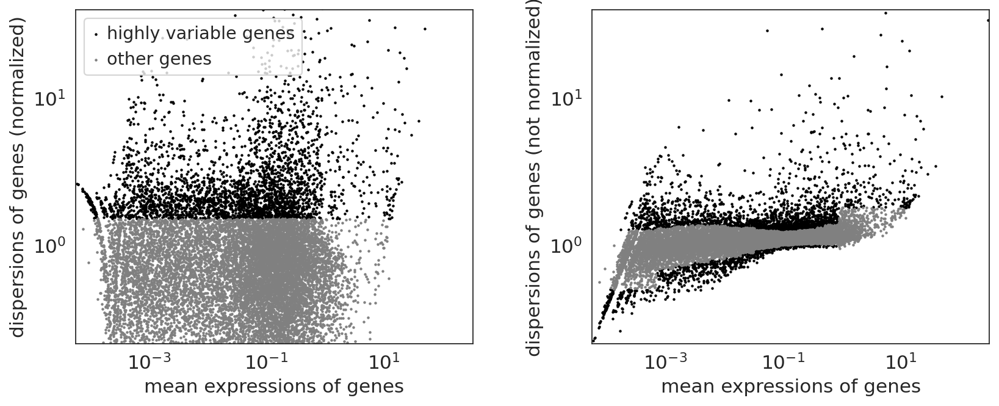

(7437, 2999)
[6] Normalizing per cell again using total_counts
normalizing by total count per cell
    finished (0:00:01): normalized adata.X and added    'total_counts', counts per cell before normalization (adata.obs)
[7] Log1p transformation
[8] Scaling
### PIPE [2] EMBEDDING DATA


  0%|          | 0/8 [00:00<?, ?it/s]

[1] Computing PCA
computing PCA
    with n_comps=50
    finished (0:00:01)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


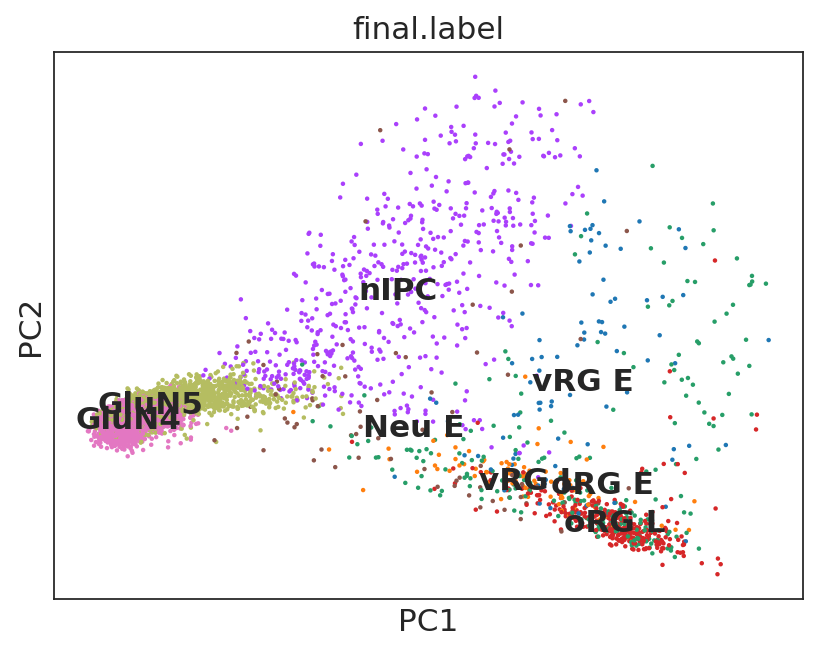

[2] Computing neighbors
computing neighbors
    computing neighbors
    computed neighbors (0:00:01)
    computed connectivities (0:00:12)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:13)
[3] Computing diffusion map
computing Diffusion Maps using n_comps=30(=n_dcs)
        initialized `.distances` `.connectivities` 
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99775445 0.993336   0.9919076  0.98581374 0.9800954
     0.9777285  0.9750644  0.96790737 0.96322966 0.95628494 0.95122147
     0.9483612  0.9428363  0.941619   0.9375321  0.9328909  0.93142736
     0.930083   0.92542714 0.9238767  0.920895   0.9149778  0.9141559
     0.9099461  0.909459   0.9044729  0.9023145  0.8993937  0.89800835]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matri

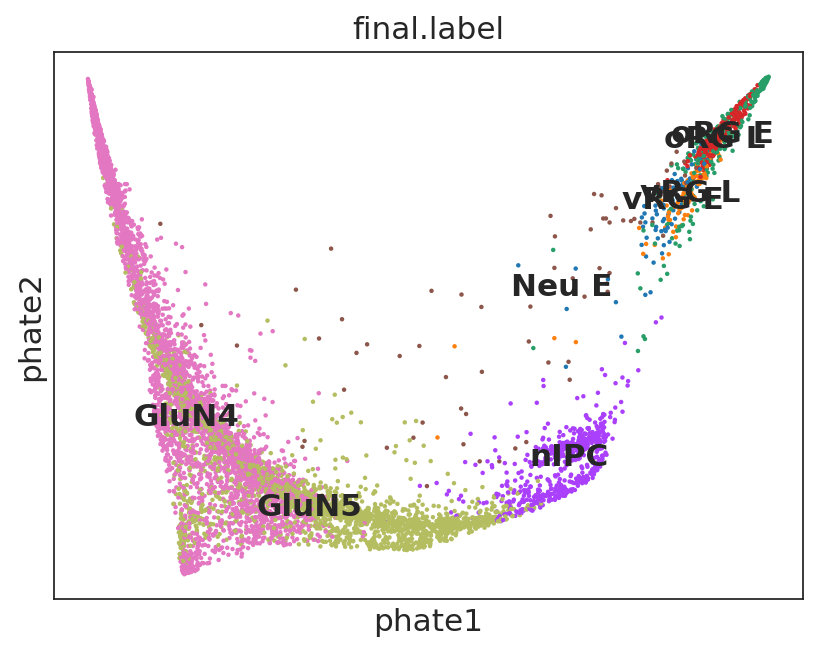

### PIPE [3] COMPUTING PSEUDOTIME


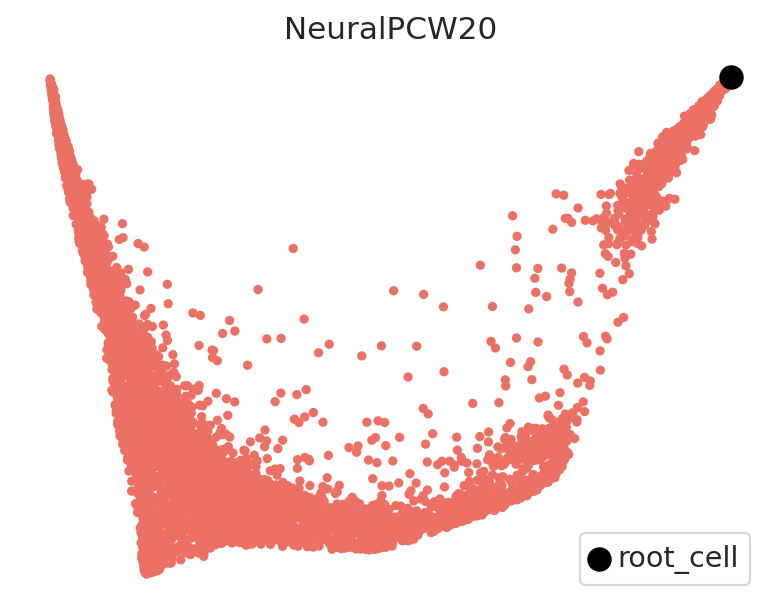

        initialized `.distances` `.connectivities` `.eigen_values` `.eigen_basis` `.distances_dpt`
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


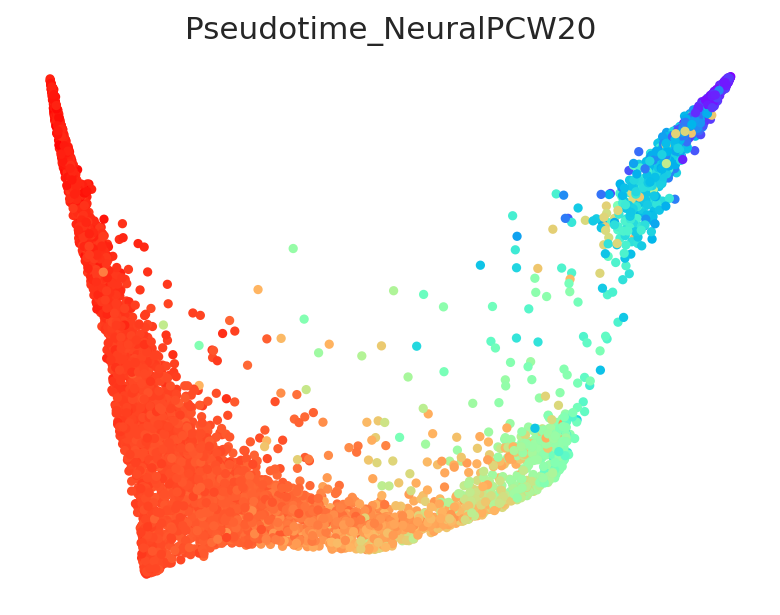

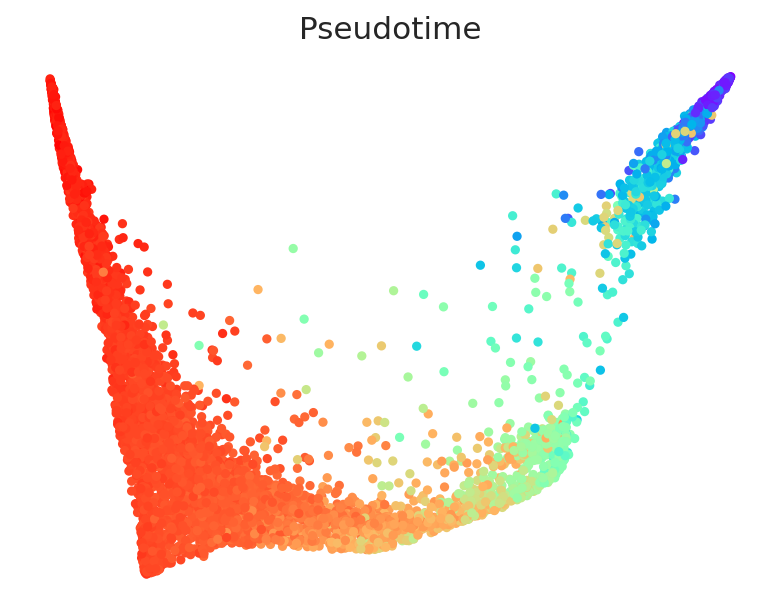

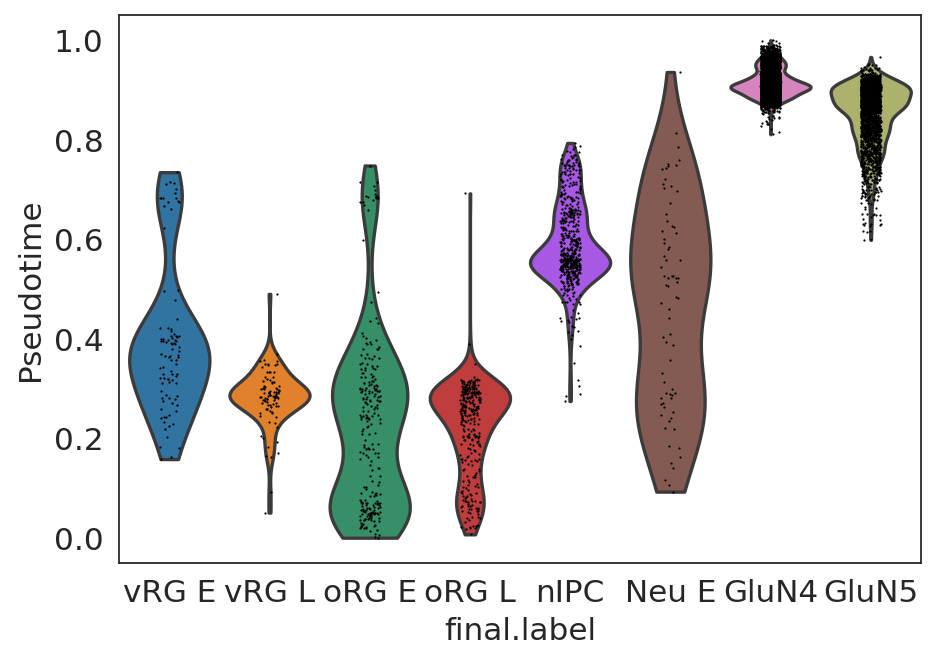

### PIPE [4] SAVING DATA


In [9]:
adata = prepare_rna.prepare_adata(
    
    adata_complete,
    group_by='final.label',
    save_dir='./',
    
    min_total_counts_per_cell=1,
    key_n_counts='total_counts',
    n_top_genes=3000,

    # prefix='test',

    nn_1_n_neighbors=20,
    nn_1_use_rep='X_pca',
    nn_1_n_pcs=10,
    dm_n_comps=30,
    nn_2_n_neighbors=100,

    phate_run_on='X_scvi',
    phate_knn=100, 
    phate_n_pca=50, 
    phate_decay=15, 
    phate_t='auto',
    
    skip_umap=True,
    skip_paga=True,
    skip_phate=False,
    random_state=None,    

    root_cells='hft_w20_p3_r2_CTATCCGAGGCGCTCT',
    lineages=None, 
    lineage_name=subset,
    embedding_key='X_phate',
    # embedding_key='X_draw_graph_fa',
    verbose=True)

# **Part 3 //** Fit GRN to expression

In [10]:
import network_fit

In [11]:
sorted(os.listdir())

['.ipynb_checkpoints',
 'ATAC.cell_metadata.tsv',
 'ATAC.peak_metadata.tsv',
 'ATAC.unprocessed.tsv',
 'Gradient.Perturbation.celloracle.gradient',
 'Links.Perturbation.celloracle.links',
 'Links.celloracle.links',
 'Oracle.Perturbation.celloracle.oracle',
 'Oracle.celloracle.oracle',
 'RNA.processed.h5ad',
 'RNA.unprocessed.h5ad',
 'RootCellSelection.html',
 'Rplots.pdf',
 'base_grn.coaccessibility=0.8.score=8.base_grn.parquet',
 'celloracle_tfinfo.coaccessibility=0.8.score=8.celloracle.tfinfo',
 'cicero.log',
 'cicero_connections.csv',
 'cicero_connections.rds',
 'cicero_peaks.csv',
 'cicero_umap.pdf',
 'cluster_GRN',
 'coaccessible_peaks.coaccessibility=0.8.csv',
 'figures',
 'network_plots',
 'perturbations',
 'perturbations.wrong p.mass',
 'test.RNA.processed.h5ad']

In [13]:
oracle, links = network_fit.network_fit_pipe(
    adata_fname = 'RNA.processed.h5ad',
    base_GRN_fname = 'base_grn.coaccessibility=0.8.score=8.base_grn.parquet',
    cluster_column_name = 'final.label',
    max_n_pcs = 50,
    links_alpha=10,
    
    embedding_name='X_phate',
    
    tempdir=f'/scratch/{subset}/tmp/',
    
    links_pval=0.001,
    links_top_n_coef=2000,
    seed = 4,
    verbose = True,
    save_dir='./',
    test_mode=False)

  0%|          | 0/7 [00:00<?, ?it/s]

[1] Reading data
Loading adata
Loading GRN
[2] Prepairing oracle object


  0%|          | 0/4 [00:00<?, ?it/s]

[1] Instatiating Oracle with raw RNA-Seq data
    Expression range: count     7437.000000
mean      2259.392822
std       1316.697998
min        199.000000
25%       1556.000000
50%       1888.000000
75%       2435.000000
max      12650.000000
dtype: float64
[2] Adding GRN data to Oracle
[3] Computing and selecting PCs and k for neighbors
[4] Computing KNNs:
    n cells: 7437
    k: 185
    oracle.knn_imputation(n_pca_dims=n_comps, k=185, balanced=True, b_sight=1480, b_maxl=740, n_jobs=-1)
Oracle object

Meta data
    celloracle version used for instantiation: 0.12.0
    n_cells: 7437
    n_genes: 2999
    cluster_name: final.label
    dimensional_reduction_name: X_phate
    n_target_genes_in_TFdict: 19985 genes
    n_regulatory_in_TFdict: 1098 genes
    n_regulatory_in_both_TFdict_and_scRNA-seq: 165 genes
    n_target_genes_both_TFdict_and_scRNA-seq: 2671 genes
    k_for_knn_imputation: 185
Status
    Gene expression matrix: Ready
    BaseGRN: Ready
    PCA calculation: Done
    Knn i

  0%|          | 0/8 [00:00<?, ?it/s]

Inferring GRN for GluN4...


  0%|          | 0/2671 [00:00<?, ?it/s]

Inferring GRN for GluN5...


  0%|          | 0/2671 [00:00<?, ?it/s]

Inferring GRN for Neu E...


  0%|          | 0/2671 [00:00<?, ?it/s]

Inferring GRN for nIPC...


  0%|          | 0/2671 [00:00<?, ?it/s]

Inferring GRN for oRG E...


  0%|          | 0/2671 [00:00<?, ?it/s]

Inferring GRN for oRG L...


  0%|          | 0/2671 [00:00<?, ?it/s]

Inferring GRN for vRG E...


  0%|          | 0/2671 [00:00<?, ?it/s]

Inferring GRN for vRG L...


  0%|          | 0/2671 [00:00<?, ?it/s]

[4] Checking links
All fits are valid.
[5] Postprocessing links
[6] Scoring genes


  0%|          | 0/8 [00:00<?, ?it/s]

/scratch/NeuralPCW20/tmp/33/9/scratch/NeuralPCW20/tmp/33/93/scratch/NeuralPCW20/tmp/33/79/scratch/NeuralPCW20/tmp/33/6



/scratch/NeuralPCW20/tmp/33/84/scratch/NeuralPCW20/tmp/33/2

/scratch/NeuralPCW20/tmp/33/28
/scratch/NeuralPCW20/tmp/33/39
/users/genomics/xoel/venvs/cicero/bin/R
/users/genomics/xoel/venvs/cicero/bin/R
/users/genomics/xoel/venvs/cicero/bin/R
/users/genomics/xoel/venvs/cicero/bin/R
/users/genomics/xoel/venvs/cicero/bin/R
/users/genomics/xoel/venvs/cicero/bin/R
/users/genomics/xoel/venvs/cicero/bin/R
/users/genomics/xoel/venvs/cicero/bin/R



Attaching package: ‘igraph’

The following objects are masked from ‘package:stats’:

    decompose, spectrum

The following object is masked from ‘package:base’:

    union


Attaching package: ‘igraph’

The following objects are masked from ‘package:stats’:

    decompose, spectrum

The following object is masked from ‘package:base’:

    union


Attaching package: ‘igraph’

The following objects are masked from ‘package:stats’:

    decompose, spectrum

The following object is masked from ‘package:base’:

    union


Attaching package: ‘igraph’

The following objects are masked from ‘package:stats’:

    decompose, spectrum

The following object is masked from ‘package:base’:

    union


Attaching package: ‘igraph’

The following objects are masked from ‘package:stats’:

    decompose, spectrum

The following object is masked from ‘package:base’:

    union


Attaching package: ‘igraph’

The following objects are masked from ‘package:stats’:

    decompose, spectrum

The following 

[7] Saving results
- Saving raw links per cluster


  0%|          | 0/8 [00:00<?, ?it/s]

- Saving filtered links per cluster


  0%|          | 0/8 [00:00<?, ?it/s]

- Saving processed links
- Saving oracle


In [14]:
%matplotlib Agg
network_fit.pipe_plots(links)

  0%|          | 0/5 [00:00<?, ?it/s]

GluN4
GluN5
Neu E
nIPC
oRG E
oRG L
vRG E
vRG L


  0%|          | 0/8 [00:00<?, ?it/s]

degree_centrality_all
eigenvector_centrality


  0%|          | 0/3 [00:00<?, ?it/s]

Genes in filtered network: 829


  0%|          | 0/829 [00:00<?, ?it/s]

ABRACL
ACAT2
ACTB
ACTG1
ADCY1
ADGRV1
ADRA2A
AFF3
AHI1
AKAP12
AKAP9
ALDOC
AMOTL2
AMPH
ANK2
ANK3
ANKRD36C
ANP32B
ANP32E
ANXA1
ANXA5
AP2S1
APOE
AQP4
ARC
ARHGAP11A
ARHGAP18
ARID3A
ARID5B
ARL4C
ARL6IP1
ARPP21
ARX
ASCL1
ASPM
ATAD2
ATF3
ATP1A2
ATP1B1
ATP1B2
ATP2B1
ATXN1
AURKA
AURKB
B2M
B3GAT2
BAALC
BACH2
BARD1
BASP1
BBX
BCAN
BCL11A
BCL11B
BHLHE22
BHLHE40
BIRC5
BMP7
BNIP3
BOC
BRCA1
BRCA2
BTBD8
BTG1
BTG2
BUB1
BUB1B
C14orf132
C1QL2
C1orf115
CA12
CACNA2D1
CADM1
CADM2
CADM3
CALM1
CAMK2B
CAMK2N1
CAMK4
CAP2
CASP3
CCDC137
CCDC175
CCHCR1
CCL2
CCN1
CCNA2
CCNB1
CCNB2
CCND2
CCNI
CCSAP
CD24
CD38
CD9
CDC20
CDC42EP3
CDC6
CDCA2
CDCA3
CDCA7
CDCA8
CDH4
CDK1
CDKN2C
CDKN3
CDO1
CDON
CDT1
CEBPD
CENPA
CENPE
CENPF
CENPK
CENPL
CENPM
CENPO
CENPQ
CENPU
CEP126
CEP135
CEP290
CEP78
CHEK1
CHL1
CISD1
CKAP2
CKAP2L
CKAP5
CKB
CKS2
CLMP
CLSPN
CLU
CNN3
CNR1
CNTN2
CNTNAP2
COA3
COL9A2
COL9A3
COMMD4
COPS8
COPS9
CORO1C
CREB3L1
CREB5
CREBRF
CRH
CRX
CRYAB
CSPG5
CSRNP3
CSRP2
CST3
CTSH
CUX2
CWF19L2
CXXC4
DAB1
DACH1
DACT1
DBF4
DBI
DBP
DC

  0%|          | 0/829 [00:00<?, ?it/s]

()

# **Part 4 //** Perturbation analysis

In [6]:
import perturbations

In [7]:
sorted(os.listdir())

['.ipynb_checkpoints',
 'ATAC.cell_metadata.tsv',
 'ATAC.peak_metadata.tsv',
 'ATAC.unprocessed.tsv',
 'Gradient.Perturbation.celloracle.gradient',
 'Links.Perturbation.celloracle.links',
 'Links.celloracle.links',
 'Oracle.Perturbation.celloracle.oracle',
 'Oracle.celloracle.oracle',
 'RNA.processed.h5ad',
 'RNA.unprocessed.h5ad',
 'RootCellSelection.html',
 'Rplots.pdf',
 'base_grn.coaccessibility=0.8.score=8.base_grn.parquet',
 'celloracle_tfinfo.coaccessibility=0.8.score=8.celloracle.tfinfo',
 'cicero.log',
 'cicero_connections.csv',
 'cicero_connections.rds',
 'cicero_peaks.csv',
 'cicero_umap.pdf',
 'cluster_GRN',
 'coaccessible_peaks.coaccessibility=0.8.csv',
 'figures',
 'network_plots',
 'perturbations']

In [8]:
# o = perturbations.co.load_hdf5('Oracle.celloracle.oracle')

# knn = o.adata.obs['final.label'].value_counts().min()-2
# knn

In [9]:
knn = 72
knn

72

  0%|          | 0/7 [00:00<?, ?it/s]

[1] Loading data
[2] Re-filtering links
[3] Getting TF dict
[4] Fitting for simulation


  0%|          | 0/8 [00:00<?, ?it/s]

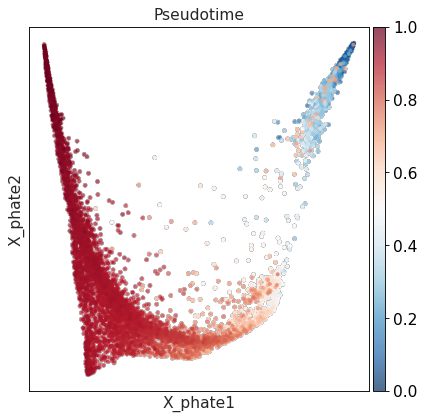

[5] Computing grid p_mass
[6] Transferring pseudotime to grid
KNN pseudotime-transfer model


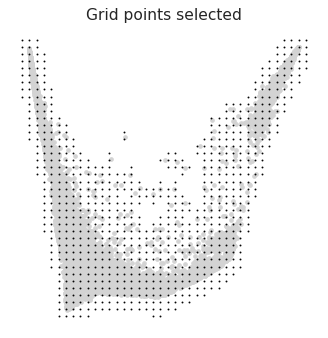

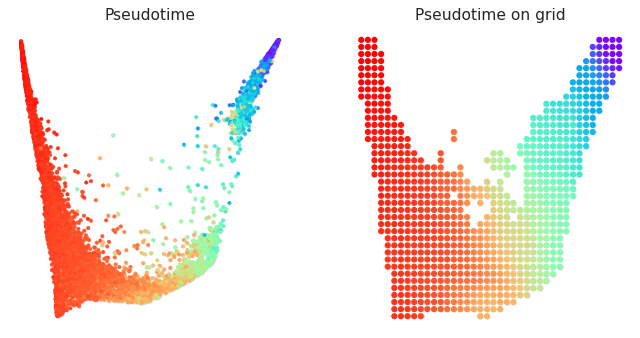

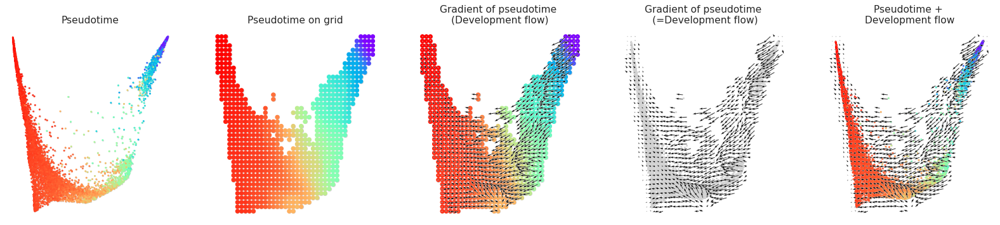

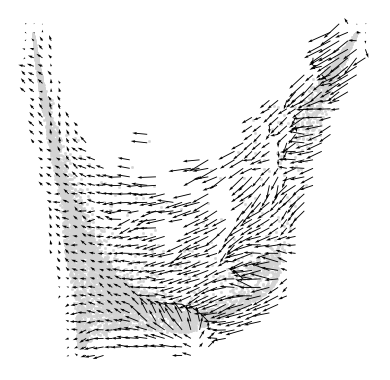

[7] Saving data
	Links
	Oracle
	Gradient


In [19]:
%matplotlib inline

oracle, links, gradient = perturbations.prepare_data(
    oracle_fname='./Oracle.celloracle.oracle', 
    links_fname='./Links.celloracle.links',
    
    palette = None,
    group_by = None,
    
    grn_fit_ridge_alpha = 10,
    
    p_mass_smooth = 0.8,
    p_mass_n_grid = 40,
    p_mass_n_neighbors = knn,
    p_mass_filter_min = 1.8e2,   

    method='knn',
    n_knn=knn,
    n_poly=3,
    scale_dev = 30,
    s=5,
    
    # save_dir=None,
    save_dir='./',
    prefix=None,
    verbose=True)

### KO simulation

In [13]:
# %matplotlib Agg
%matplotlib inline

In [11]:
import celloracle as co

oracle = co.load_hdf5('./Oracle.Perturbation.celloracle.oracle')
gradient = co.load_hdf5('./Gradient.Perturbation.celloracle.gradient')

In [33]:
adata = perturbations.sc.read_h5ad('RNA.unprocessed.h5ad', backed=True)
palette = dict(zip(adata.obs['final.label'].cat.categories, adata.uns['final.label_colors']))

oracle.adata.obs['final.label'] = perturbations.pd.Categorical(oracle.adata.obs['final.label'].astype(str), categories=['vRG E', 'vRG L', 'oRG E', 'oRG L', 'nIPC', 'Neu E', 'GluN5', 'GluN4'])
oracle.adata.uns['final.label_colors'] = [palette[k] for k in oracle.adata.obs['final.label'].cat.categories]
oracle.update_cluster_colors(palette)

Excluding: []
Selected number of neighbors: 74


  0%|          | 0/3 [00:00<?, ?it/s]

perturbation_hdf5/KO.FOXP1.celloracle.hdf5


  0%|          | 0/5 [00:00<?, ?it/s]

Calculating expression shift
Estimating transition probabilities
Calculating embedding shift
Calculating p_mass
Running Markov chain simulation
File path: ./perturbations/perturbation_hdf5/KO.FOXP1.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.FOXP1.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.FOXP1.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.FOXP1.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.FOXP1.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.FOXP1.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.FOXP1.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.FOXP1.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.FOXP1.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.FOXP1.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.FOXP1.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.FOXP1.celloracle.hdf5
Dumping to ./per

  0%|          | 0/5 [00:00<?, ?it/s]

perturbation_hdf5/KO.KLF6.celloracle.hdf5


  0%|          | 0/5 [00:00<?, ?it/s]

Calculating expression shift
Estimating transition probabilities
Calculating embedding shift
Calculating p_mass
Running Markov chain simulation
File path: ./perturbations/perturbation_hdf5/KO.KLF6.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.KLF6.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.KLF6.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.KLF6.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.KLF6.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.KLF6.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.KLF6.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.KLF6.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.KLF6.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.KLF6.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.KLF6.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.KLF6.celloracle.hdf5
Dumping to ./perturbations/p

  0%|          | 0/5 [00:00<?, ?it/s]

perturbation_hdf5/KO.MEF2C.celloracle.hdf5


  0%|          | 0/5 [00:00<?, ?it/s]

Calculating expression shift
Estimating transition probabilities
Calculating embedding shift
Calculating p_mass
Running Markov chain simulation
File path: ./perturbations/perturbation_hdf5/KO.MEF2C.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.MEF2C.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.MEF2C.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.MEF2C.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.MEF2C.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.MEF2C.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.MEF2C.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.MEF2C.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.MEF2C.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.MEF2C.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.MEF2C.celloracle.hdf5
Dumping to ./perturbations/perturbation_hdf5/KO.MEF2C.celloracle.hdf5
Dumping to ./per

  0%|          | 0/5 [00:00<?, ?it/s]

Getting PS for all groups


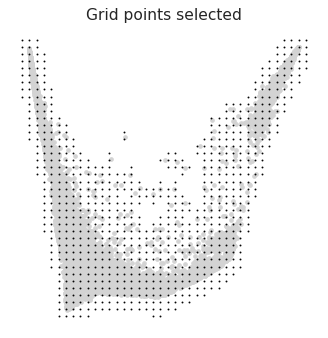

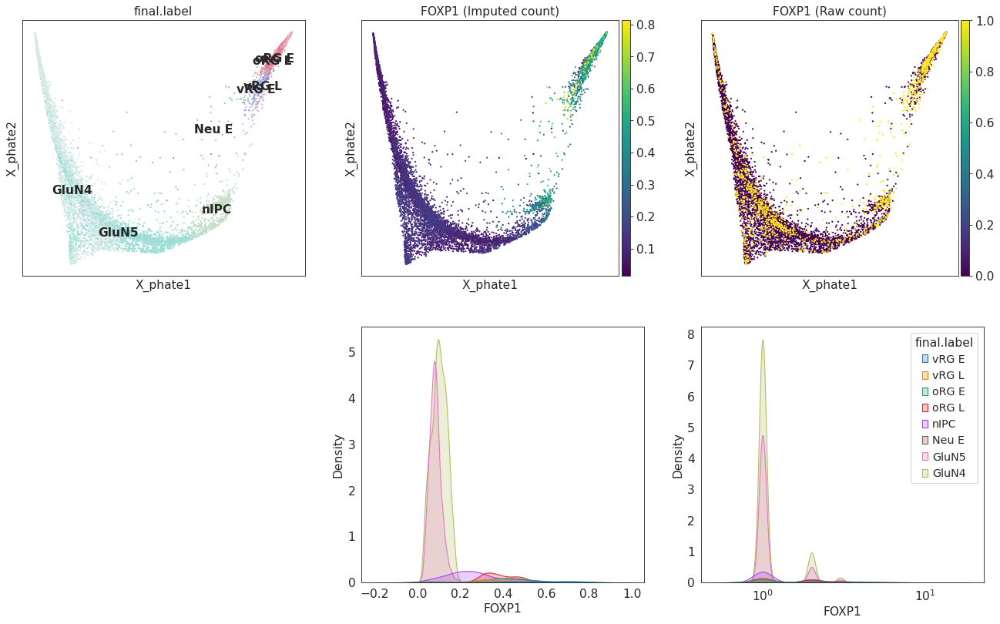

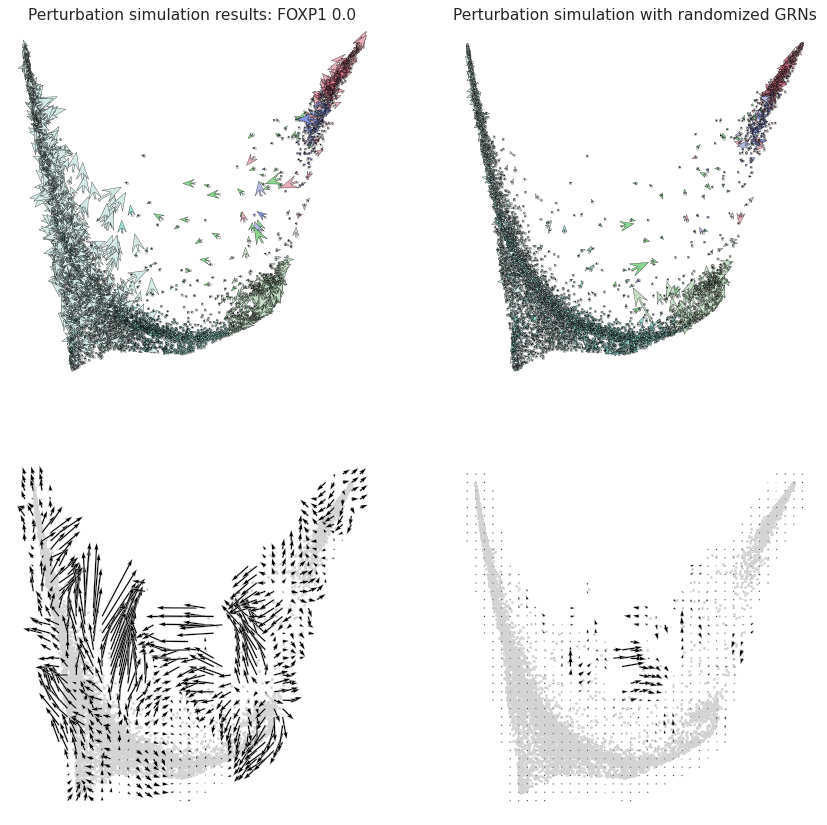

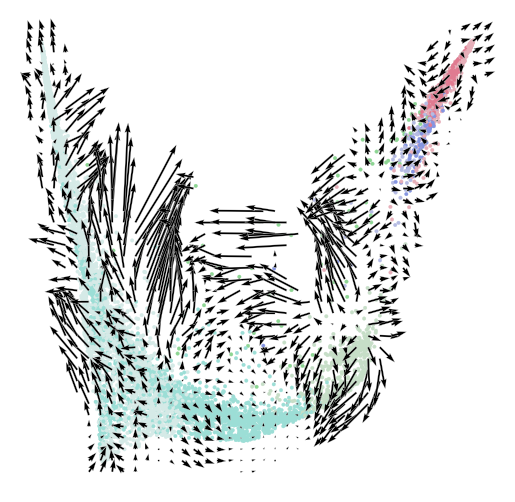

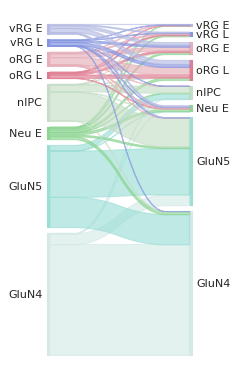

...

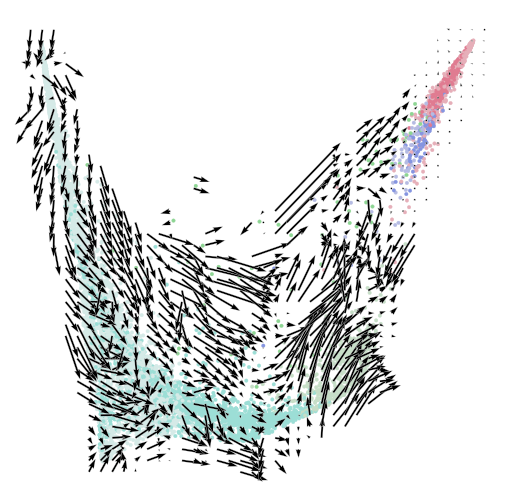

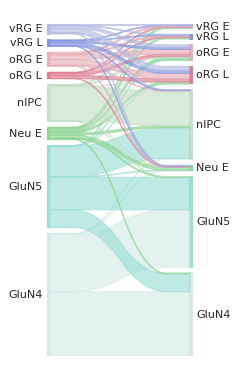

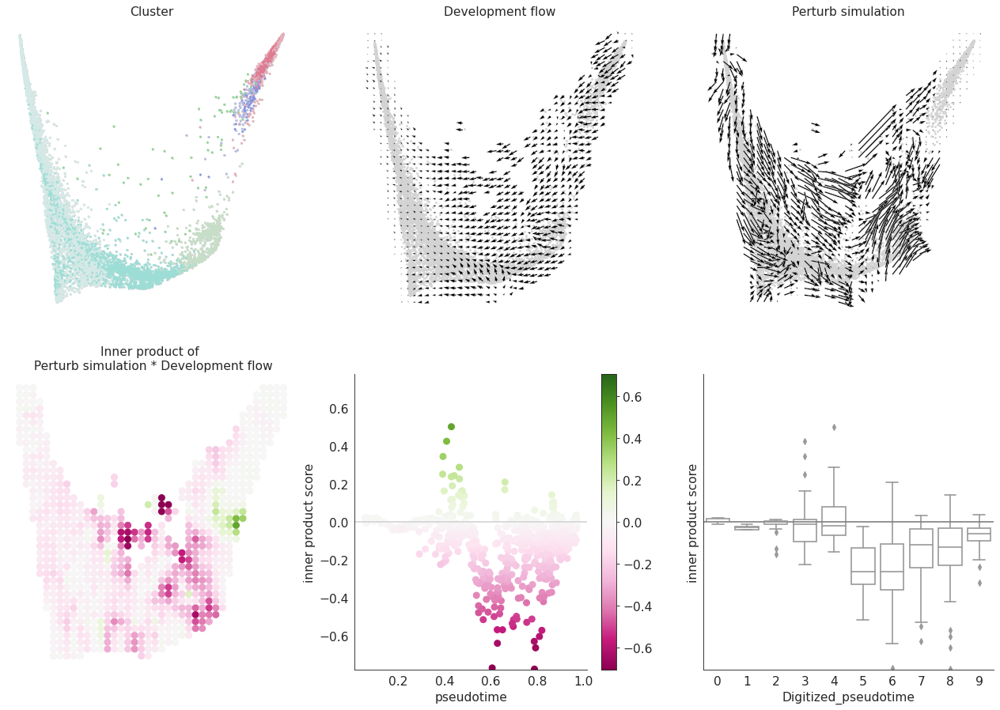

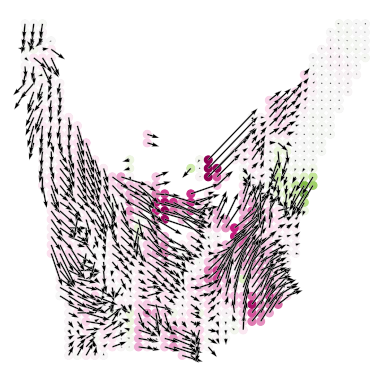

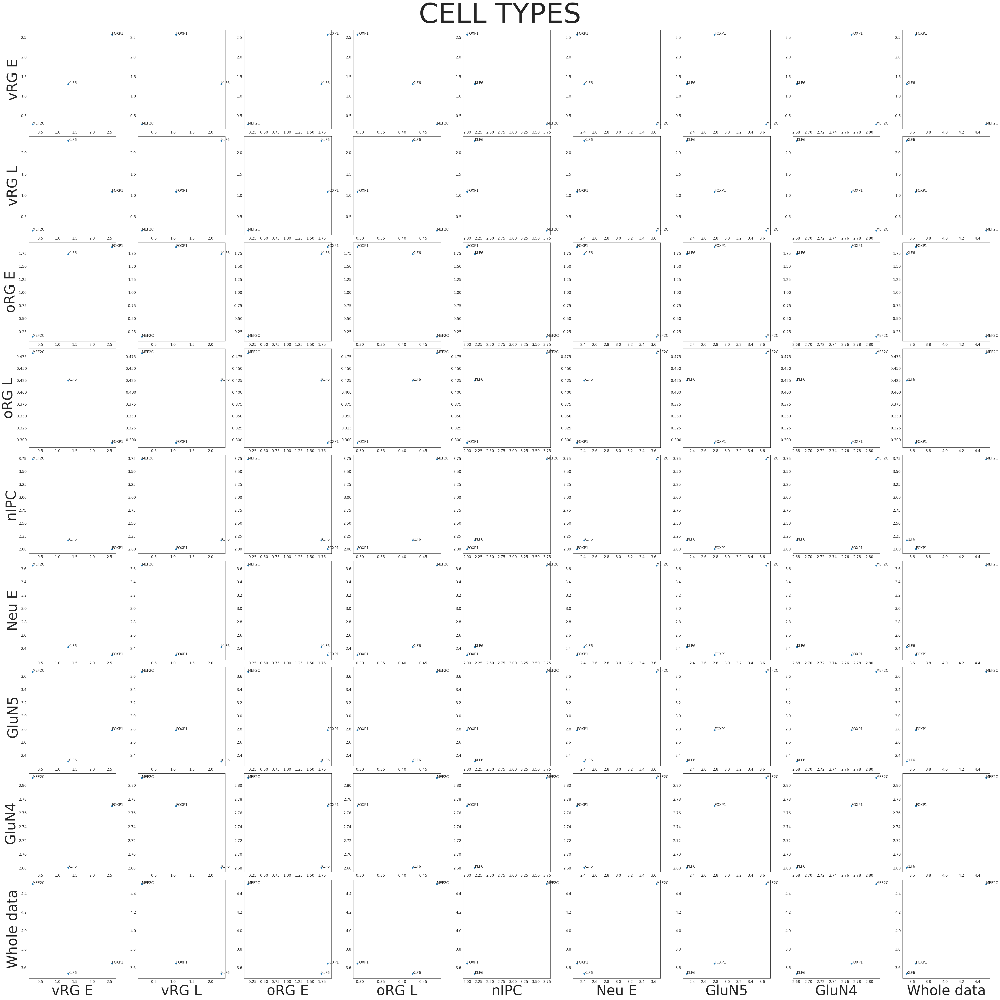

In [46]:
ps_sums = perturbations.run_systemic_simulation_async(oracle, gradient, groups=groups, 
                                                      genes=['FOXP1', 'MEF2C', 'KLF6'],

                                                      p_mass_smooth=0.8,
                                                      p_mass_n_grid=40,
                                                      p_mass_n_neighbors=knn,
                                                      p_mass_filter_min=1.8e2,

                                                                  
                                                      n_cores=n_cores, n_parallel_genes=1, overwrite=True)

### Carlo genes

In [8]:
oracle = perturbations.co.load_hdf5('Oracle.Perturbation.celloracle.oracle')
gradient = perturbations.co.load_hdf5('Gradient.Perturbation.celloracle.gradient')

In [9]:
carlo_genes = perturbations.pd.read_csv('~/codebases/co_new/raw/carlo_genes_pattern_12.csv')['Gene'].unique().tolist()

carlo_tfs = [c for c in carlo_genes if c in oracle.active_regulatory_genes]
carlo_in = [c for c in carlo_genes if c in oracle.adata.var_names]

In [18]:
carlo_dict = perturbations.pd.read_csv('~/codebases/co_new/raw/carlo_genes_pattern_12.csv').groupby('Top/Bottom')['Gene'].unique().to_dict()

carlo_tfs_dict = {k:[c for c in v if c in oracle.active_regulatory_genes] for k, v in carlo_dict.items()}
carlo_in_dict = {k:[c for c in v if c in oracle.adata.var_names] for k, v in carlo_dict.items()}

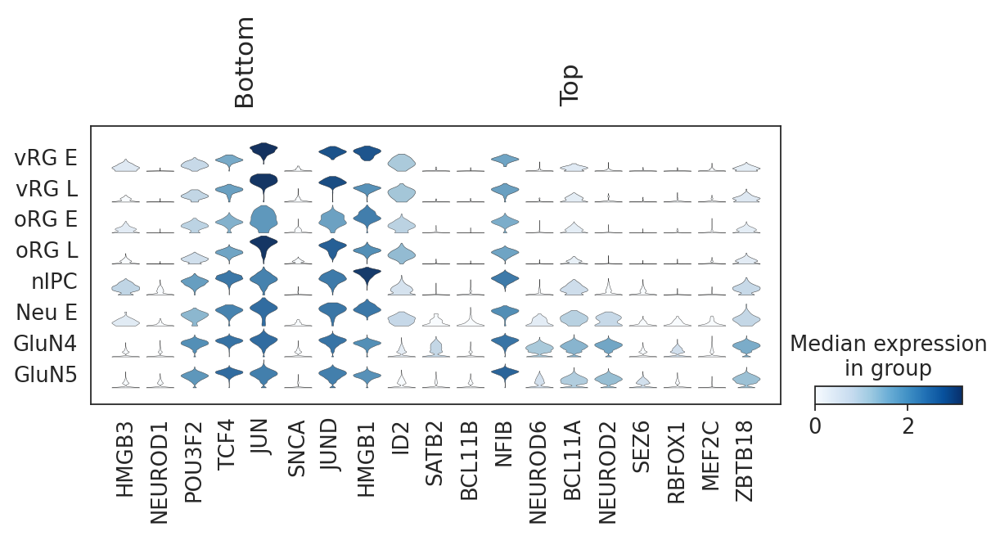

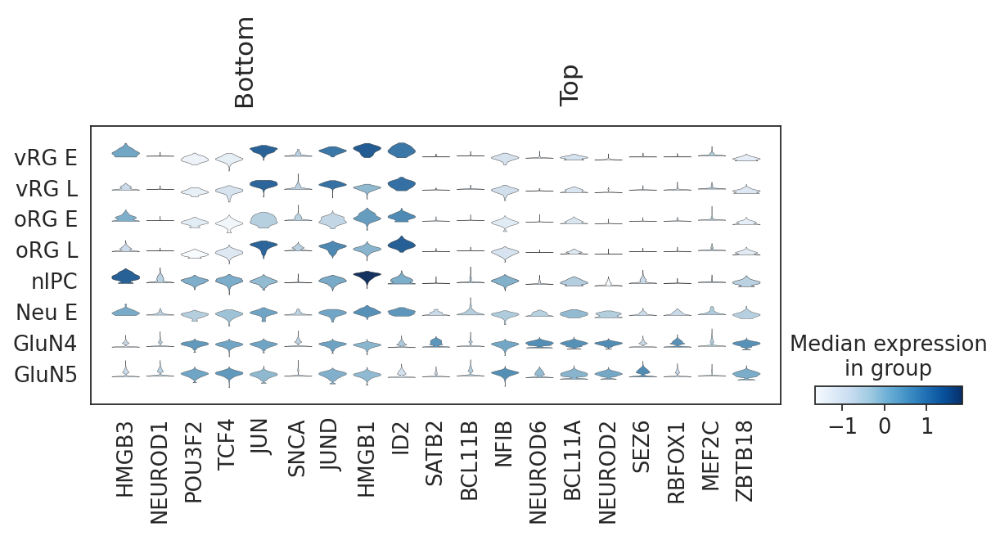

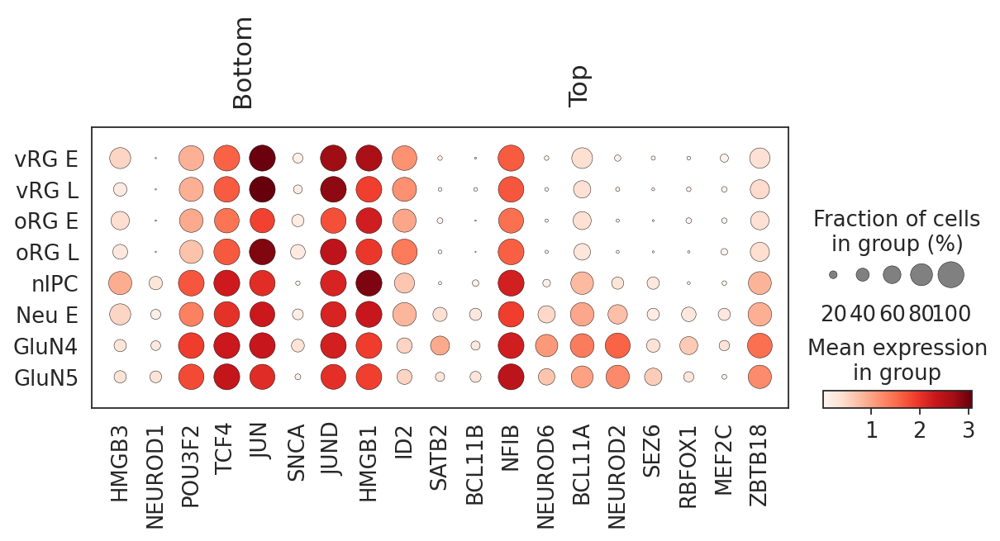

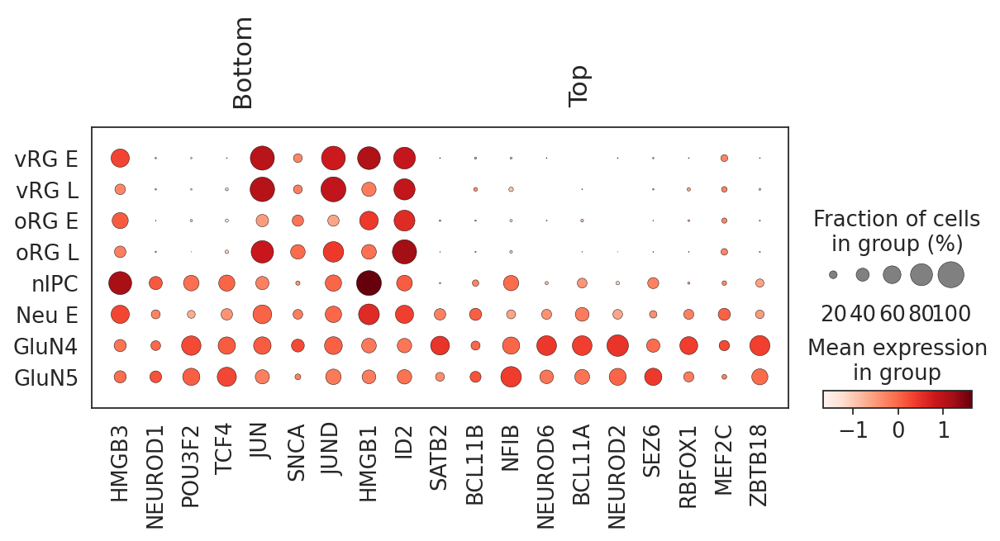

In [24]:
%matplotlib inline 
perturbations.sc.pl.stacked_violin(oracle.adata,
                                   var_names=carlo_in_dict,
                                   layer='log1p',
                                   groupby='final.label',
                                   save='carlo_genes_log1p')
%matplotlib inline 
perturbations.sc.pl.stacked_violin(oracle.adata,
                                   var_names=carlo_in_dict,
                                   layer='scaled',
                                   groupby='final.label',
                                   save='carlo_genes_scaled')
perturbations.sc.pl.dotplot(oracle.adata,
                                   var_names=carlo_in_dict,
                                   layer='log1p',
                                   groupby='final.label',
                                   save='carlo_genes_log1p')
%matplotlib inline 
perturbations.sc.pl.dotplot(oracle.adata,
                                   var_names=carlo_in_dict,
                                   layer='scaled',
                                   groupby='final.label',
                                   save='carlo_genes_scaled')

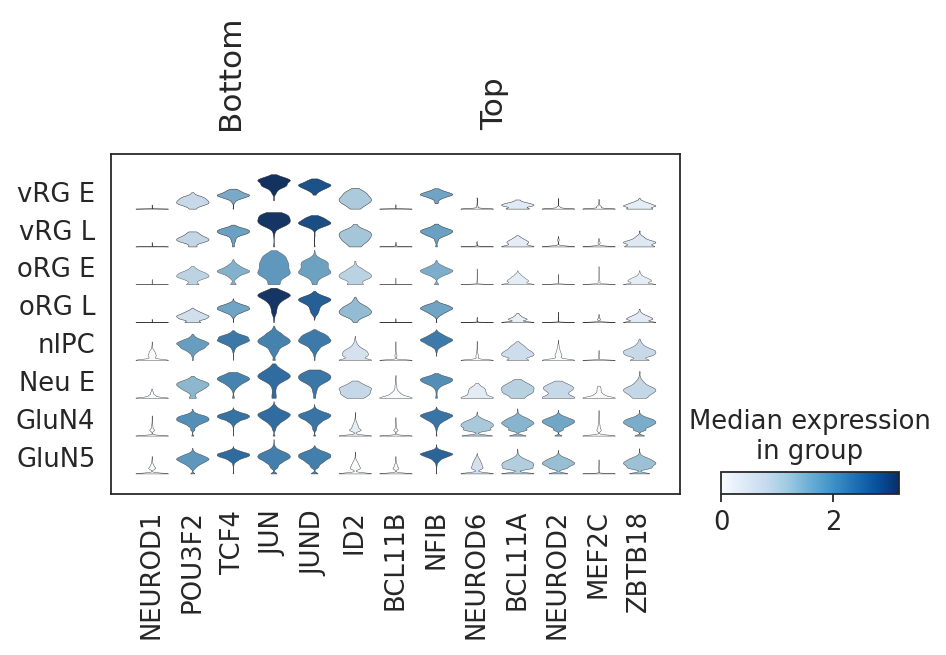

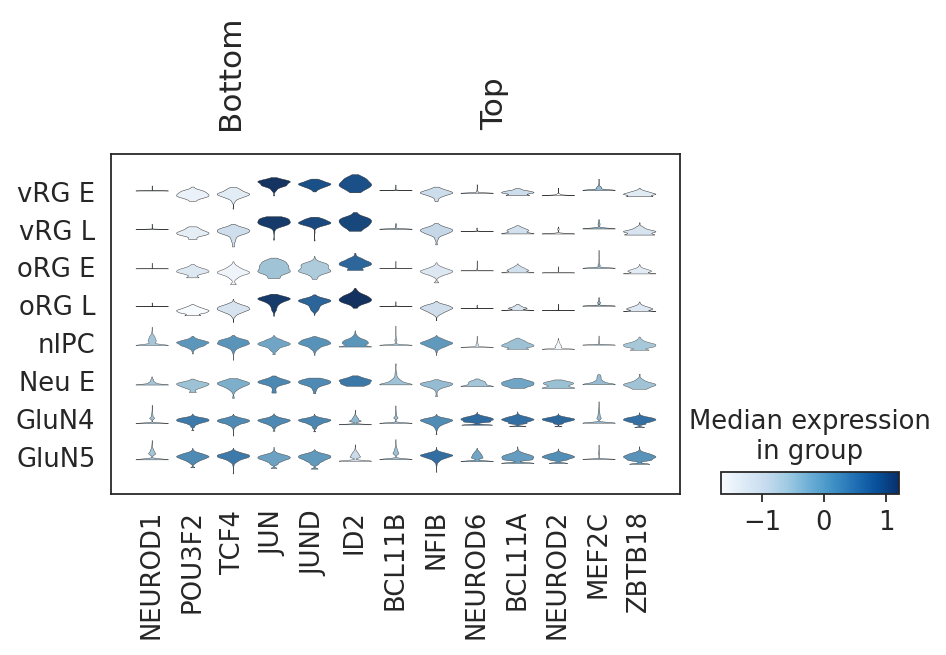

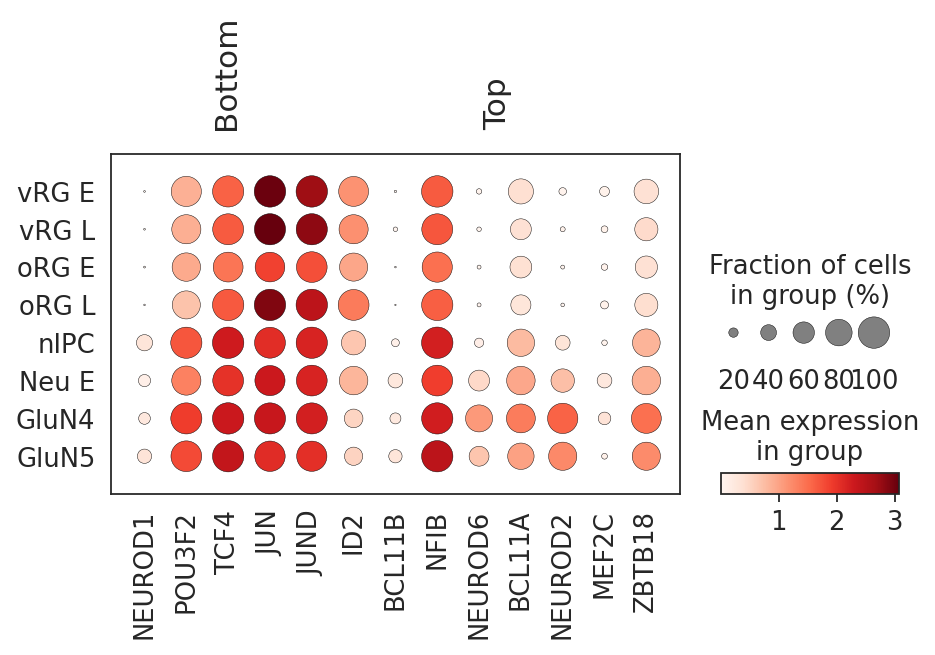

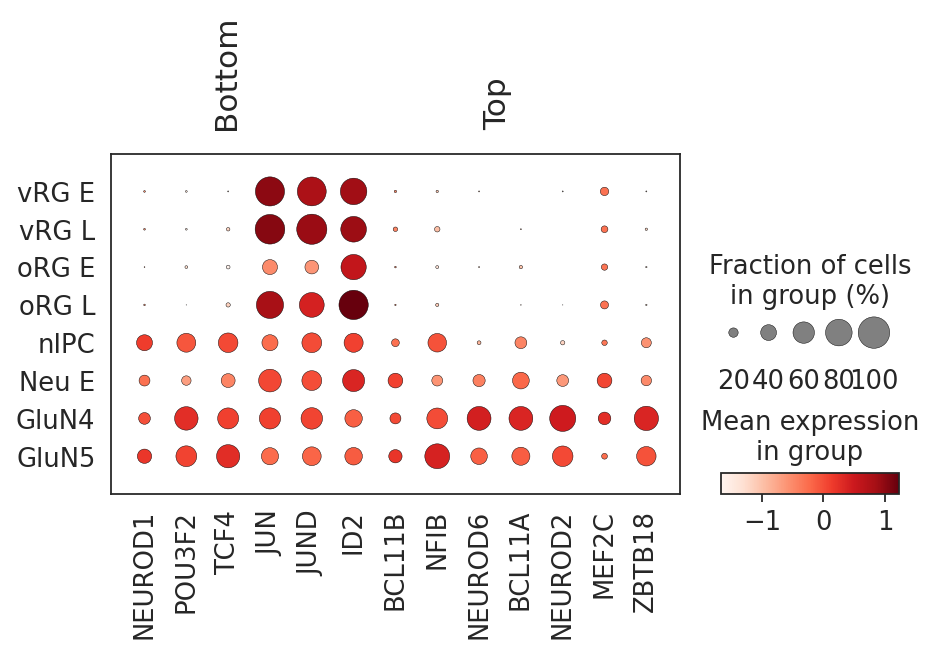

In [25]:
%matplotlib inline 
perturbations.sc.pl.stacked_violin(oracle.adata,
                                   var_names=carlo_tfs_dict,
                                   layer='log1p',
                                   groupby='final.label',
                                   save='carlo_tfs_log1p')
%matplotlib inline 
perturbations.sc.pl.stacked_violin(oracle.adata,
                                   var_names=carlo_tfs_dict,
                                   layer='scaled',
                                   groupby='final.label',
                                   save='carlo_tfs_scaled')
perturbations.sc.pl.dotplot(oracle.adata,
                                   var_names=carlo_tfs_dict,
                                   layer='log1p',
                                   groupby='final.label',
                                   save='carlo_tfs_log1p')
%matplotlib inline 
perturbations.sc.pl.dotplot(oracle.adata,
                                   var_names=carlo_tfs_dict,
                                   layer='scaled',
                                   groupby='final.label',
                                   save='carlo_tfs_scaled')

In [26]:
{perturbations.sc.tl.score_genes(adata=oracle.adata, gene_list=v, score_name=f'score_{k}_in', use_raw=True) for k, v in carlo_in_dict.items()}

computing score 'score_Bottom_in'
    finished: added
    'score_Bottom_in', score of gene set (adata.obs).
    150 total control genes are used. (0:00:01)
computing score 'score_Top_in'
    finished: added
    'score_Top_in', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)


{None}

In [27]:
{perturbations.sc.tl.score_genes(adata=oracle.adata, gene_list=v, score_name=f'score_{k}_tf', use_raw=True) for k, v in carlo_tfs_dict.items()}

computing score 'score_Bottom_tf'
    finished: added
    'score_Bottom_tf', score of gene set (adata.obs).
    100 total control genes are used. (0:00:01)
computing score 'score_Top_tf'
    finished: added
    'score_Top_tf', score of gene set (adata.obs).
    149 total control genes are used. (0:00:00)


{None}

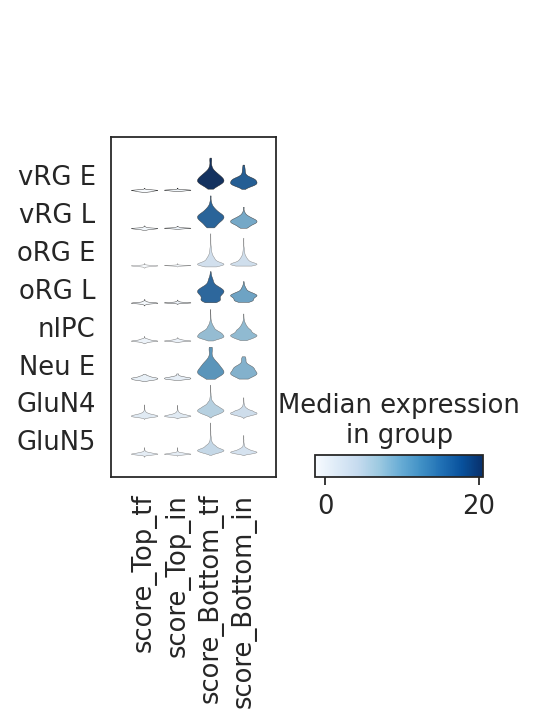

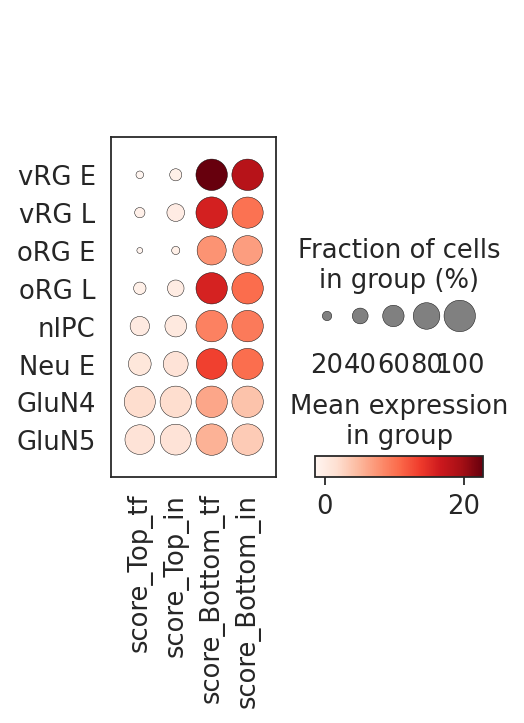

In [33]:
%matplotlib inline 
perturbations.sc.pl.stacked_violin(oracle.adata,
                                   var_names=[f'score_Top_tf',
                                              f'score_Top_in',
                                              f'score_Bottom_tf',
                                              f'score_Bottom_in'],
                                   # standard_scale='var',
                                   groupby='final.label',
                                   save='carlo_scores')
perturbations.sc.pl.dotplot(oracle.adata,
                            expression_cutoff=0,
                            
                                   var_names=[f'score_Top_tf',
                                              f'score_Top_in',
                                              f'score_Bottom_tf',
                                              f'score_Bottom_in'],
                                   # standard_scale='var',
                                   groupby='final.label',
                                   save='carlo_scores')

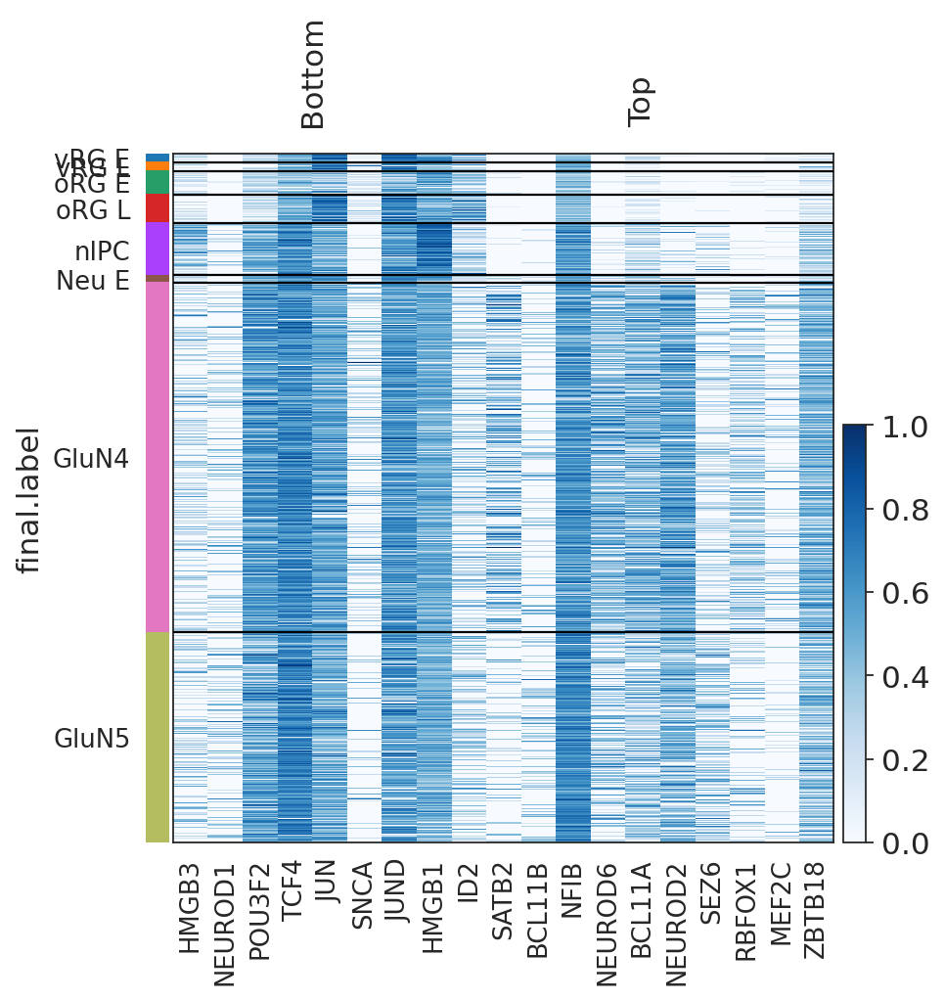

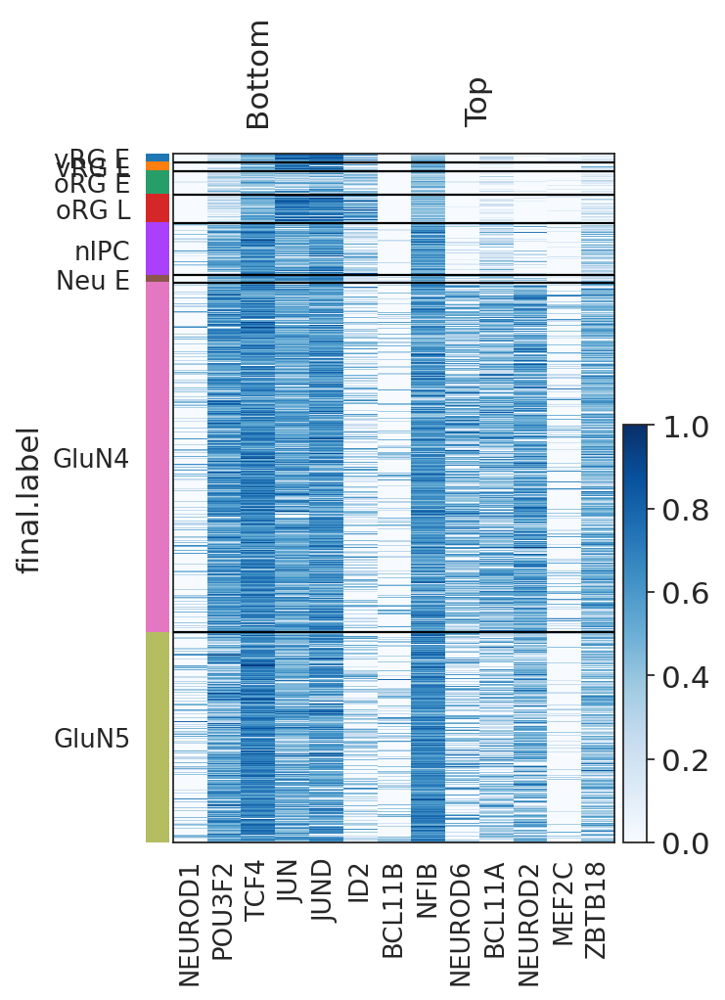

In [36]:
perturbations.sc.pl.heatmap(
    oracle.adata,

    # dendrogram=True,
    var_names=carlo_in_dict,
    standard_scale='var',
    layer='log1p',
    cmap=perturbations.sc.pl.palettes.cm.Blues,
    groupby='final.label',
    save='_carlo_genes'
)

perturbations.sc.pl.heatmap(
    oracle.adata,

    # dendrogram=True,
    var_names=carlo_tfs_dict,
    standard_scale='var',
    layer='log1p',
    cmap=perturbations.sc.pl.palettes.cm.Blues,
    groupby='final.label',
    save='_carlo_tfs'
)

In [9]:
ps_sums = perturbations.run_systemic_simulation_async(
    oracle, gradient, groups=groups, 
    genes=['FOXG1'], #carlo_genes,
    n_cores=n_cores, n_parallel_genes=1, overwrite=True,
    p_mass_smooth = 0.8,
    p_mass_n_grid = 40,
    p_mass_n_neighbors = 200,
    p_mass_filter_min = 0.0017
)

Excluding: []
Selected number of neighbors: 74


0it [00:00, ?it/s]

Getting PS for all groups


ValueError: No objects to concatenate

In [14]:
'FOXG1' in oracle.adata.var_names

False

### OE simulation

# Explore

### Expression

In [6]:
import scanpy as sc
import pandas as pd
import numpy as np

from scanpy.plotting._anndata import _prepare_dataframe

In [7]:
adata = sc.read_h5ad('RNA.processed.h5ad', backed=True)

In [11]:
palette = pd.read_csv('../../results/CellTypeColor.csv')
palette = {k: v for k, v in palette.set_index('Name')['hex'].to_dict().items() if k in adata.obs['final.label'].cat.categories}

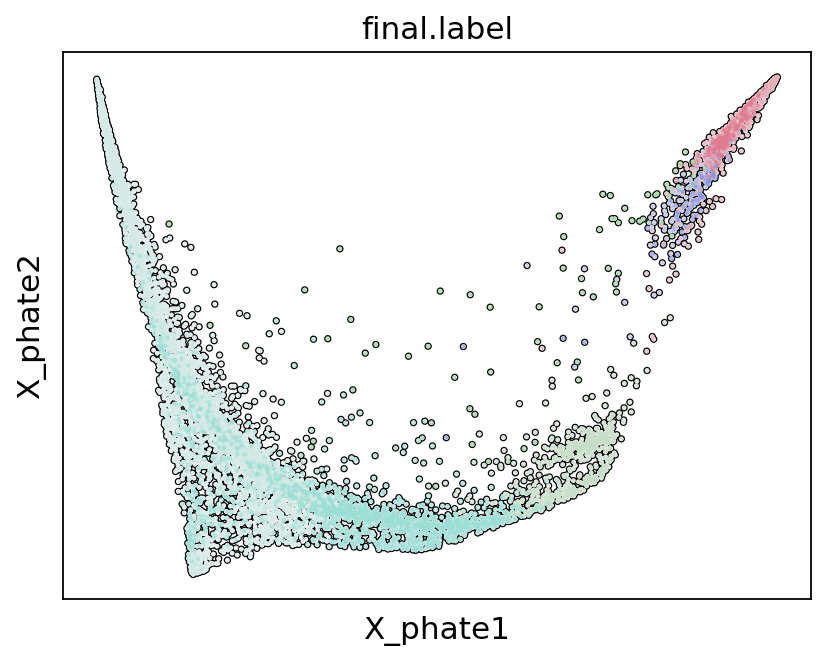

In [23]:
%matplotlib inline
p = sc.pl.embedding(adata, 
                basis='X_phate',
                color='final.label',
                palette=palette,
                return_fig=True,
                size=15,
                legend_loc=None,
                add_outline=True)

p.savefig('figures/phate.png', dpi=600)
p.savefig('figures/phate.pdf')

### h

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np

from scanpy.plotting._anndata import _prepare_dataframe

In [7]:
adata = sc.read_h5ad('RNA.processed.h5ad', backed=True)

In [11]:
pss = pd.read_csv('perturbations/KO.PerturbationScores.csv', index_col=0)
pss[pss['group']=='Neu E']

,group,score,gene
13,Neu E,24.138731,ARID3A
46,Neu E,0.840105,ARID5B
79,Neu E,3.422115,ARX
112,Neu E,20.061606,ASCL1
145,Neu E,5.641964,ATF3
...,...,...,...
5260,Neu E,5.680665,ZIC5
5293,Neu E,2.173655,ZKSCAN4
5326,Neu E,6.031237,ZNF331
5359,Neu E,10.046938,ZNF667


In [8]:
pss = pd.read_csv('perturbations/KO.PerturbationScores.csv', index_col=0)
pss['log1p.score'] = np.log1p(pss['score'])
pss['rel_max.log1p.score'] = pss['log1p.score'] / pss.groupby('group')['log1p.score'].transform(np.max)
pss['q90'] = pss.groupby('group')['log1p.score'].transform(lambda x: x >= x.quantile(0.9))
all_genes = pss.gene.unique()
q90_genes = pss.gene[pss['q90']].unique()
q90_dict = pss[pss.q90].groupby('group')['gene'].unique().to_dict()
ct_q90_dict = {k:v  for k, v in q90_dict.items() if k in adata.obs['final.label'].cat.categories}
lin_q90_dict = {k:v  for k, v in q90_dict.items() if not k in adata.obs['final.label'].cat.categories and not 'not_' in k}

Storing dendrogram info using `.uns['dendrogram_final.label']`


/users/genomics/xoel/venvs/co_0.12/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


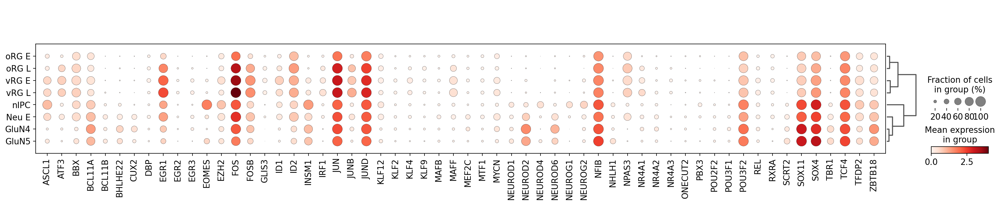

In [9]:
%matplotlib inline

sc.tl.dendrogram(adata, groupby='final.label', var_names=q90_genes)

sc.pl.dotplot(adata, q90_genes, 'final.label', layer='log1p', dendrogram=True)
# dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

In [14]:
sel = ['RGC', 'nIPC', 'GluN']
q90_sel = { k: v for k, v in q90_dict.items() if k in sel}

/users/genomics/xoel/venvs/co_0.12/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


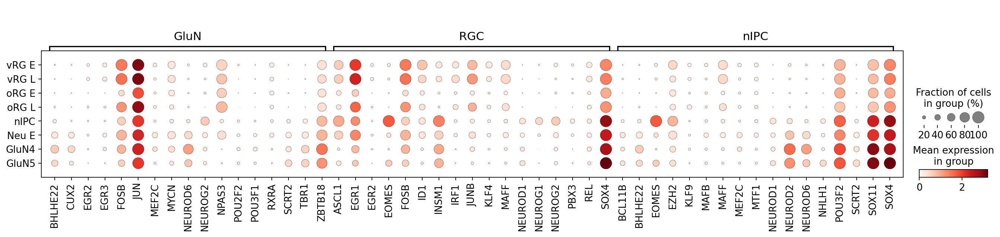

In [17]:
sc.pl.dotplot(adata, q90_sel, 'final.label', dendrogram=False, layer='log1p')

In [61]:
sizes = (_prepare_dataframe(adata, var_names=all_genes, groupby='final.label', use_raw=True, log=False)[1]>0).groupby('final.label').mean().T

exps = _prepare_dataframe(adata, var_names=all_genes, groupby='final.label', use_raw=False, layer='log1p', log=False)[1].groupby('final.label').mean().T

for k in lin_q90_dict.keys():

     if k != 'Whole data':
        a = adata[adata.obs['final.label'].isin(groups[k]), all_genes]
        mean = _prepare_dataframe(adata, var_names=all_genes, groupby='final.label', use_raw=False, layer='log1p', log=False)[1].mean().T
        pct = (_prepare_dataframe(a, var_names=all_genes, groupby='final.label', use_raw=True, log=False)[1]>0).mean()
        exps[k] = mean
        sizes[k] = pct

In [66]:
exps.to_csv('perturbations/KO.PerturbationScoreExpression.csv', index=True)
sizes.to_csv('perturbations/KO.PerturbationScoreExpressionPct.csv', index=True)